### Perkenalan

    Nama    : I Made Dhanan Pradipta


    Dataset : Uber-Lyft Price Prediction
    Summary : Data yang digunakan adalah data pemakaian moda transportasi online yang berdomisili di Amerika, yaitu Uber dan Lyft, data pada bulan November - Desember ini, memiliki 
              beberapa feature yang terbilang lengkap contohnya kondisi cuaca (weather), kelembaban, dan juga datetime pada saat konsumen memesan transportasi online, terdapat juga 
              jenis dari transportasi online tersebut dengan wilayah berangkat dan juga destinasi yang dituju

    Objektif : Membuat sebuah linear Regression model antara target (price) dan juga feature yang disediakan oleh dataset

***
### Import Libraries 

- library yang digunakan adalah pandas dan juga numpy, untuk visualisasi menggunakan seaborn dan plotly, untuk membuat model linear regression dari train split sampai mencari mse yaitu sklearn

In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

pd.options.display.max_rows = None
pd.options.display.max_columns = None

import warnings
warnings.filterwarnings('ignore')

---
### Data Loading

- Pada data loading, digunakan options.maxrows dan maxcolumns = None, utk melihat keseluruhan data

In [10]:
df = pd.read_csv('dataset/rideshare_kaggle.csv')
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,visibility.1,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,lyft_line,Shared,5.0,0.44,1.0,42.2148,-71.033,42.34,37.12,Mostly Cloudy,Rain throughout the day.,0.0000,0.0,0.68,8.66,9.17,1545015600,10.000,43.68,1544968800,34.19,1545048000,37.95,1544968800,27.39,1545044400,partly-cloudy-night,32.70,1021.98,57,0.72,0,10.000,303.8,1544962084,1544994864,0.30,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,lyft_premier,Lux,11.0,0.44,1.0,42.2148,-71.033,43.58,37.35,Rain,"Rain until morning, starting again in the eve...",0.1299,1.0,0.94,11.98,11.98,1543291200,4.786,47.30,1543251600,42.10,1543298400,43.92,1543251600,36.20,1543291200,rain,41.83,1003.97,90,1.00,0,4.786,291.1,1543232969,1543266992,0.64,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,38.33,32.93,Clear,Light rain in the morning.,0.0000,0.0,0.75,7.33,7.33,1543334400,10.000,47.55,1543320000,33.10,1543402800,44.12,1543320000,29.11,1543392000,clear-night,31.10,992.28,240,0.03,0,10.000,315.7,1543319437,1543353364,0.68,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,lyft_luxsuv,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,34.38,29.63,Clear,Partly cloudy throughout the day.,0.0000,0.0,0.73,5.28,5.28,1543514400,10.000,45.03,1543510800,28.90,1543579200,38.53,1543510800,26.20,1543575600,clear-night,26.64,1013.73,310,0.00,0,10.000,291.1,1543492370,1543526114,0.75,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,lyft_plus,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,37.44,30.88,Partly Cloudy,Mostly cloudy throughout the day.,0.0000,0.0,0.70,9.14,9.14,1543446000,10.000,42.18,1543420800,36.71,1543478400,35.75,1543420800,30.29,1543460400,partly-cloudy-night,28.61,998.36,303,0.44,0,10.000,347.7,1543405904,1543439738,0.72,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [11]:
#inspek info dari dataset yang digunakan
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

- terdapat 57 columns dengan 693071 rows 

In [12]:
#cek null value pada dataset
df.isnull().sum()

id                                 0
timestamp                          0
hour                               0
day                                0
month                              0
datetime                           0
timezone                           0
source                             0
destination                        0
cab_type                           0
product_id                         0
name                               0
price                          55095
distance                           0
surge_multiplier                   0
latitude                           0
longitude                          0
temperature                        0
apparentTemperature                0
short_summary                      0
long_summary                       0
precipIntensity                    0
precipProbability                  0
humidity                           0
windSpeed                          0
windGust                           0
windGustTime                       0
v

- terdapat null value pada kolom _price_

In [13]:
new_df = df.copy()

- copy dataset sebagai dataset cadangan yang nantinya digunakan bila kita sudah terlanjur memodifikasi dataset awal

In [14]:
new_df['datetime'] = pd.to_datetime(new_df['datetime'])

- karena kolom _datetime_ masih berupa object, maka langkah pertama yaitu ubah ke type datetime

In [15]:
new_df.dropna(axis=0, inplace=True)

- hapus null value pada dataset, dalam hal ini kolom _price_ <br>
apakah perlu dicek sebelum didrop? <br>
Jawabanya tidak, karena null value terdapat pada kolom target, dimana kolom tersebut jika memiliki value kosong harus didrop

- terdapat keanehan pada kolom _visibility.1_, karena terdapat kolom lain dengan nama _visibility_

In [16]:
new_df.visibility.head()

0    10.000
1     4.786
2    10.000
3    10.000
4    10.000
Name: visibility, dtype: float64

In [17]:
new_df['visibility.1'].head()

0    10.000
1     4.786
2    10.000
3    10.000
4    10.000
Name: visibility.1, dtype: float64

In [18]:
new_df.drop(['visibility.1'], axis=1, inplace=True)

- Setelah dicek, 2 kolom tersebut sama persis satu dengan lainya, sehingga bisa didrop salah satunya

---
### EDA (Exploratory Data Analysis )

EDA dilakukan untuk menyiapkan dataset sebelum dilakukan proses preprocessing atau feature engginering, pada bagian ini kita analisis kolom yang terdapat pada dataset <br>
untuk mendukung hasil dari preproccesing nantinya

#### 1.  Time Analysis 

Time analysis dilakukan untuk menganalisis kolom yang berkaitan dengan waktu dari transportasi online tersebut beroperasi

In [19]:
#groub by bulan dan hari menggunakan parameter jam
new_df.groupby(['month', 'day']).agg('hour').sum()

month  day
11     26      441615
       27      794587
       28     1018762
       29      506526
       30      477210
12     1       476531
       2       475009
       3       475408
       4        33843
       9        35167
       10        3283
       13      467887
       14      475129
       15      474882
       16      475061
       17      475765
       18      305677
Name: hour, dtype: int64

pada analisis bagian ini, dipakai 3 buah kolom yaitu _hour_, _day_ dan _month_

##### a.  Hour   
_Hour_ menunjukan jam transportasi online tersebut beroperasi selama 24 jam per harinya 

In [20]:
#buat df baru untuk visualisasi hour
hour_df = new_df.groupby('hour').size().reset_index(name="counts")

    hour  counts
0      0   29872
1      1   26310
2      2   26323
3      3   25530
4      4   26125
5      5   22995
6      6   25147
7      7   22930
8      8   22337
9      9   26673
10    10   27918
11    11   27946
12    12   28017
13    13   27977
14    14   27976
15    15   27868
16    16   27972
17    17   28075
18    18   27958
19    19   25410
20    20   24620
21    21   25549
22    22   27093
23    23   29355


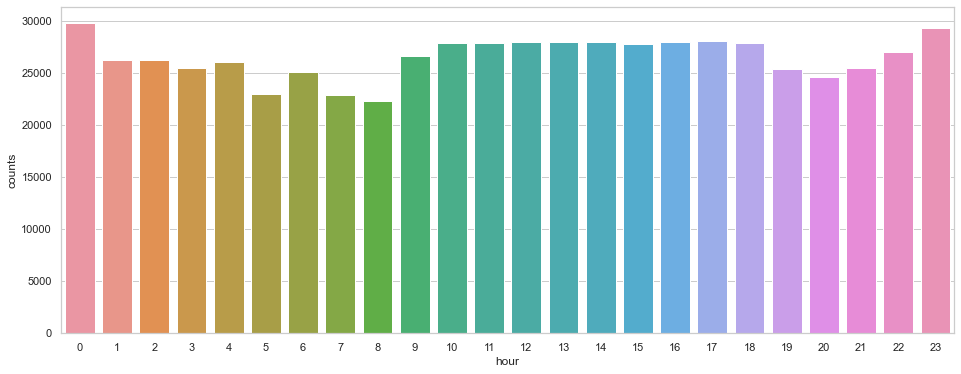

In [21]:
print(hour_df)

sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 6))
ax = sns.barplot(x="hour", y="counts", data=hour_df)

Ket :

- Dari visualisasi di atas dapat dijabarkan bahwa, konsumen paling banyak memakai transportasi online pada tengah malam (23.00 - 00.00), dan stabil pada office hour (10.00 - 18.00)
- titik terendah pemakaian uber/lyft pada jam 8.00 am

##### b. Day
_day_ menunjukan intensitas pemakaian uber dan lyft per hari nya

In [22]:
#buat df baru untuk visualisasi day
day_df = new_df.groupby('day').size().reset_index(name="counts")

    day  counts
0     1   41680
1     2   41298
2     3   41323
3     4   11627
4     9    1529
5    10    2534
6    13   35496
7    14   41344
8    15   41332
9    16   41359
10   17   41354
11   18   33329
12   26   29028
13   27   70135
14   28   67842
15   29   55222
16   30   41544


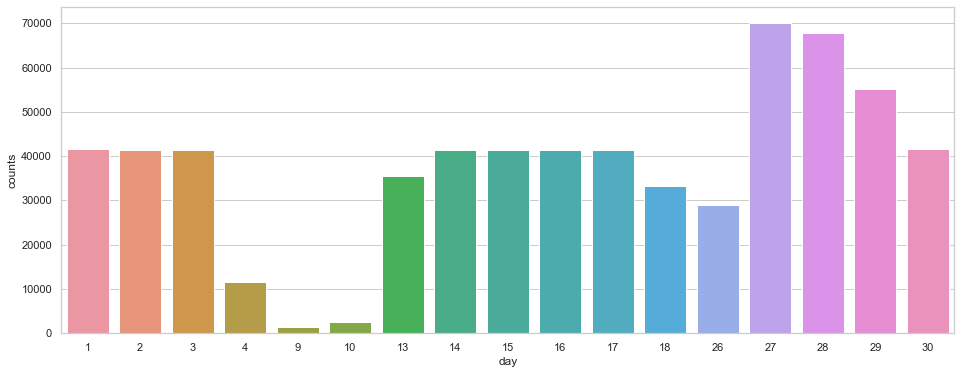

In [23]:
print(day_df)

plt.figure(figsize=(16, 6))
ax = sns.barplot(x="day", y="counts", data=day_df)

Ket :

- Dari visualisasi di atas, dapat dijabarkan bahwa, user lebih banyak memakai online transportation pada tanggal 27
- Terdapat tanggal yang kosong (Ex : 5 - 7), yang dapat diartikan bahwa pada tanggal tersebut, user tidak ada yang memakai online transportation (Uber/Lyft)

##### c. Month
_month_ menunjukan intensitas pemakaian uber dan lyft berdasarkan bulan

In [24]:
#buat df baru untuk visualisasi month
month_df = new_df.groupby('month').size().reset_index(name="counts")

   month  counts
0     11  263771
1     12  374205


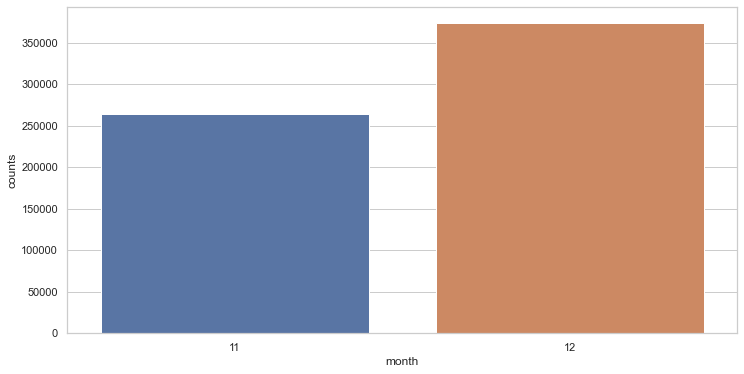

In [25]:
print(month_df)

plt.figure(figsize=(12, 6))
ax = sns.barplot(x="month", y="counts", data=month_df)

Ket :

- Data yang digunakan hanya pada bulan November dan Desember
- penggunaan transportasi online (Uber/Lyft) lebih banyak digunakan pada bulan Desember

#### 2.  Address Analysis
analisis ini dilakukan untuk melihat seberapa banyak intensitas pemakaian transportasi online (Uber/lyft) berdasarkan tujuan dan tempat keberangkatan dari konsumer

In [26]:
#cek banyak value dari kolom source
new_df['source'].value_counts()

Financial District         54197
Back Bay                   53201
Theatre District           53201
Boston University          53172
North End                  53171
Fenway                     53166
Northeastern University    53164
South Station              53160
Haymarket Square           53147
West End                   52980
Beacon Hill                52841
North Station              52576
Name: source, dtype: int64

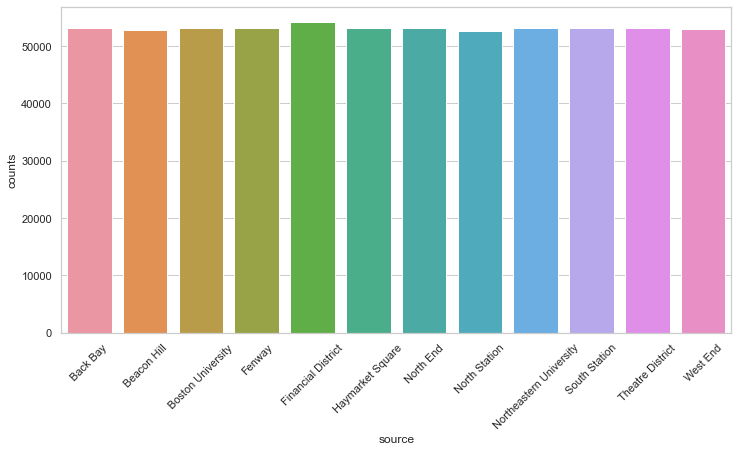

In [27]:
source = new_df.groupby('source').size().reset_index(name="counts")
plt.figure(figsize=(12, 6))
ax = sns.barplot(x="source", y="counts", data=source)
ax.tick_params(axis='x', rotation=45)

Ket :
- titik keberangkatan dari Financial District memiliki jumlah sedikit lebih banyak dari tempat lainya
- tidak ada perbedaan signifikan antara semua tempat keberangkatan

In [28]:
#cek count titik tujuan 
new_df['destination'].value_counts()

Financial District         54192
Back Bay                   53190
Theatre District           53189
Haymarket Square           53171
Boston University          53171
Fenway                     53166
Northeastern University    53165
North End                  53164
South Station              53159
West End                   52992
Beacon Hill                52840
North Station              52577
Name: destination, dtype: int64

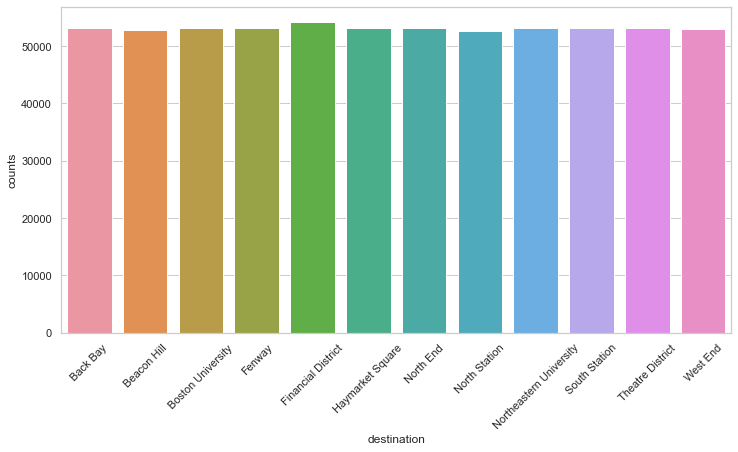

In [29]:
destination = new_df.groupby('destination').size().reset_index(name="counts")
plt.figure(figsize=(12, 6))
ax = sns.barplot(x="destination", y="counts", data=destination)
ax.tick_params(axis='x', rotation=45)

Ket :
- sama dengan titik awal keberangkatan, tujuan sedikit lebih banyak ke Financial District
- tidak ada perbedaan signifikan antara semua tempat tujuan
- tidak ada perbedaan signifikan pula antara titik keberangkatan dengan tempat yang dituju

In [30]:
#buat df baru untuk mengelompokan source dan destination
ct = new_df.groupby(['source', 'destination']).size().reset_index(name="counts")
dt = new_df.groupby(['source', 'destination']).agg('distance').sum().reset_index()
address_df = dt.merge(ct, how='inner', on=['source', 'destination'])

In [31]:
#cek distance terpanjang dari source dan destination
address_df.sort_values('distance', ascending=False).reset_index(drop=True).head(10)

,source,destination,distance,counts
0,Financial District,Boston University,46243.02,8940
1,Boston University,Financial District,40623.78,8940
2,Financial District,Fenway,39977.94,8928
3,Fenway,Financial District,38250.24,8916
4,Northeastern University,Financial District,36857.88,8874
5,Financial District,Northeastern University,35656.20,8868
6,Boston University,North Station,29956.20,8730
7,Theatre District,Boston University,29839.40,9173
8,North Station,Northeastern University,29406.24,8904
9,Northeastern University,North Station,28694.58,8904


Ket :
- Berdasarkan _distance_, titik keberangkatan Financial District ke Boston University menjadi yang terbanyak

#### 3.  Cab type Analysis
cab type menunjukan pilihan dari konsumen terhadap pemakaian tranportasi online apakah memakai Uber atau Lyft

In [32]:
#buat df baru untuk visualisasi cab type
cab = new_df.groupby('cab_type').size().reset_index(name="counts")

  cab_type  counts
0     Lyft  307408
1     Uber  330568


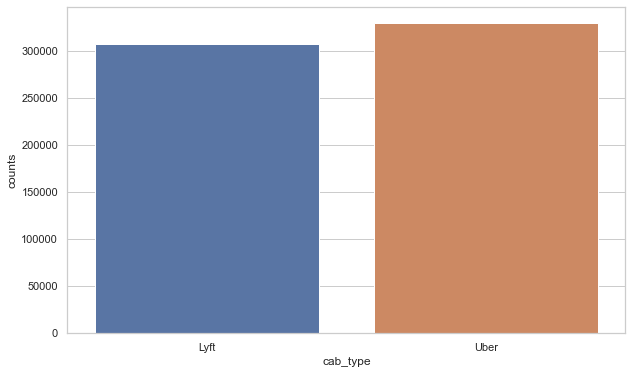

In [33]:
print(cab)
plt.figure(figsize=(10, 6))
ax = sns.barplot(x="cab_type", y="counts", data=cab)

Ket :
- penggunaan Uber lebih banyak diminati dibandingkan dengan Lyft dengan kisaraan 300k lebih pemakaian

In [34]:
#buat df baru untuk visualisasi cab type berdasarkan hour dan day
hour_cab = new_df.groupby(['hour','cab_type']).size().reset_index(name="counts")

day_cab = new_df.groupby(['day','cab_type']).size().reset_index(name="counts")

In [35]:
fig2 = px.bar(data_frame=day_cab, x="day", y="counts", color="cab_type", barmode="group")
fig2.show()

Ket :
- Kedua Brand memiliki pemakaian terbesar pada tanggal 27 - 28
- Kedua brand juga serentak tidak digunakan oleh konsumen pada tanggal 5 - 8 dan juga 19 - 25

In [36]:
fig3 = px.bar(data_frame=hour_cab, x="hour", y="counts", color="cab_type", barmode="group")
fig3.show()

Ket :
- Overall Uber selalu mengungguli Lyft dari segi pilihan konsumen pada moda transportasi online pada tiap jam nya

#### 4.  Price Analysis
Analysis ini menunjukan tingkat harga rata-rata dan darimana dan kemana harga yang paling mahal

In [37]:
#group by source dengan rata-rata price
new_df.groupby('source').agg('price').mean()

source
Back Bay                   16.047394
Beacon Hill                15.664030
Boston University          18.853034
Fenway                     18.379491
Financial District         18.181372
Haymarket Square           13.578114
North End                  15.153373
North Station              16.364006
Northeastern University    17.901124
South Station              15.672479
Theatre District           16.596994
West End                   16.108498
Name: price, dtype: float64

In [38]:
#group by destination dengan rata-rata price
new_df.groupby(['destination']).agg('price').mean()

destination
Back Bay                   16.210152
Beacon Hill                16.248335
Boston University          18.942137
Fenway                     18.146419
Financial District         18.046280
Haymarket Square           14.255553
North End                  15.002210
North Station              16.805238
Northeastern University    17.827517
South Station              14.828549
Theatre District           15.974450
West End                   16.225843
Name: price, dtype: float64

In [39]:
#tampilkan saource dan distance berdasarkan price termahal
new_df.groupby(['source','destination','distance']).agg('price').max().reset_index().sort_values(by='price',ascending=False).head()

,source,destination,distance,price
1319,Financial District,Fenway,4.43,97.5
717,Boston University,Financial District,4.37,92.0
990,Fenway,Financial District,3.89,92.0
684,Boston University,Financial District,3.75,92.0
719,Boston University,Financial District,4.39,92.0


Ket :
- Harga rata-rata untuk titik awal keberangkatan terletak pada wilayah Fenway
- Harga rata=rata untuk wilayah tujuan adalah Boston University
- Harga tertinggi dari titik keberangkatan ke tujuan adalah dari Financial District menuju ke Fenway dengan distance 4.43 yang memiliki harga 97.5
- Harga tertinggi sangat jauh dengan rata-rata harga, hal ini disinyalir bahwa data tersebut adalah outlier

---
### Preprocessing / Feature Engineering

#### Langkah-langkah :
1. Cek korelasi kolom numerikal
3. Cek korelasi kolom categorical menggunakan LabelEncoder
4. Bila, korelasi lemah drop kolom
5. Split data
6. Handling missing value
7. Handling outlier

#### Check Correlation

- pada bagian ini dilakukan memperlihatkan korelasi antara feature dengan target, untuk menentukan apakah kolom tersebut dipakai atau tidak <br>
hal ini untuk memudahkan proses modeling linear regression

In [40]:
#data sampel yang digunakan berjumlah 10 buah dari dataset awal tanpa ditraining
data_inf = new_df.sample(10, random_state=17)
data_inf

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,product_id,name,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,short_summary,long_summary,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,icon,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
150284,1e45e179-546a-48a9-9c48-3af210ba4067,1.543362e+09,23,27,11,2018-11-27 23:42:22,America/New_York,Back Bay,Boston University,Lyft,lyft_luxsuv,Lux Black XL,55.0,1.50,2.0,42.3505,-71.1054,40.38,35.18,Partly Cloudy,Light rain in the morning.,0.0000,0.00,0.71,7.73,11.57,1543305600,10.000,46.74,1543320000,33.82,1543399200,43.93,1543320000,30.36,1543399200,partly-cloudy-night,31.61,991.84,252,0.13,0,308.4,1543319478,1543353358,0.68,0.1438,1543338000,36.37,1543377600,46.74,1543320000,32.60,1543377600,43.93,1543320000
99887,44fd1122-034f-416c-a90e-f965c2aa1fef,1.543627e+09,1,1,12,2018-12-01 01:13:08,America/New_York,South Station,Theatre District,Lyft,lyft_luxsuv,Lux Black XL,26.0,1.13,1.0,42.3505,-71.1054,37.75,35.66,Overcast,Mostly cloudy throughout the day.,0.0000,0.00,0.66,3.13,3.59,1543597200,9.738,42.05,1543600800,31.31,1543662000,41.38,1543600800,28.10,1543662000,cloudy,27.49,1017.81,305,1.00,0,289.9,1543578877,1543612485,0.79,0.0004,1543593600,28.42,1543579200,42.05,1543600800,29.07,1543579200,41.38,1543600800
58493,1c70a635-5cc2-462b-a650-ecf99c4dc249,1.543776e+09,18,2,12,2018-12-02 18:33:03,America/New_York,South Station,Theatre District,Uber,55c66225-fbe7-4fd5-9072-eab1ece5e23e,UberX,8.5,1.30,1.0,42.3661,-71.0631,48.23,46.21,Light Rain,Light rain until evening.,0.0341,1.00,0.92,4.88,7.48,1543755600,1.588,50.94,1543788000,44.88,1543816800,50.27,1543788000,45.53,1543816800,rain,46.13,1006.41,129,1.00,1,282.8,1543751796,1543785235,0.86,0.0894,1543770000,36.40,1543726800,50.94,1543788000,35.78,1543748400,50.27,1543788000
419011,689accd2-480a-4b9d-ba74-c30f568d31b6,1.543331e+09,15,27,11,2018-11-27 15:09:22,America/New_York,Theatre District,North End,Uber,997acbb5-e102-41e1-b155-9df7de0a73f2,UberPool,7.0,1.57,1.0,42.3519,-71.0643,40.49,34.08,Overcast,Light rain in the morning.,0.0003,0.15,0.89,10.42,14.77,1543338000,5.011,46.72,1543320000,33.65,1543399200,43.70,1543320000,29.88,1543399200,cloudy,37.50,989.46,247,1.00,1,335.7,1543319469,1543353347,0.68,0.1422,1543338000,35.90,1543377600,46.72,1543320000,31.81,1543377600,43.70,1543320000
484995,17989773-8ee3-4e20-a816-6082be328726,1.543608e+09,19,30,11,2018-11-30 19:53:14,America/New_York,Beacon Hill,Boston University,Lyft,lyft_line,Shared,7.0,2.31,1.0,42.3644,-71.0661,41.53,39.66,Overcast,Mostly cloudy throughout the day.,0.0000,0.00,0.55,3.41,3.46,1543554000,9.975,42.57,1543600800,31.48,1543658400,40.51,1543611600,27.89,1543658400,cloudy,26.57,1016.07,252,1.00,1,274.1,1543578870,1543612473,0.79,0.0004,1543593600,28.64,1543575600,42.57,1543600800,27.20,1543568400,40.51,1543611600
660187,54019c66-428f-4805-9053-8672a37eb914,1.544723e+09,17,13,12,2018-12-13 17:50:14,America/New_York,North End,West End,Uber,997acbb5-e102-41e1-b155-9df7de0a73f2,UberPool,8.5,1.42,1.0,42.3644,-71.0661,31.24,31.24,Mostly Cloudy,Partly cloudy throughout the day.,0.0000,0.00,0.54,2.50,3.20,1544738400,9.946,33.81,1544731200,27.05,1544781600,32.82,1544734800,27.70,1544781600,partly-cloudy-day,16.42,1033.89,18,0.69,1,327.2,1544702794,1544735602,0.21,0.0001,1544716800,17.91,1544688000,33.81,1544731200,13.47,1544688000,32.82,1544734800
239609,88a4920b-df82-4dad-af3f-c88afab096ec,1.544878e+09,12,15,12,2018-12-15 12:50:11,America/New_York,South Station,Beacon Hill,Uber,55

In [41]:
new_df = new_df.drop(['id','timestamp','datetime','long_summary','apparentTemperatureHighTime','apparentTemperatureLowTime',
                  'apparentTemperatureLowTime','windGustTime','sunriseTime','sunsetTime','uvIndexTime','temperatureMinTime',
                 'temperatureMaxTime','apparentTemperatureMinTime','temperatureLowTime','apparentTemperatureMaxTime'],axis=1)

- setelah dicek, kolom-kolom di atas, perlu di drop karena <br>
1. id : value unik sangat banyak
2. timestamp, datetime : tidak digunakan kaena sudah terdapat kolom Hour, day dan month yang menunjukan waktu dari dataset
3. long_summary : sudah terdapat short summary yang memiliki deskripsi yang sama
4. attribut temperatue : sudah diwakilkan oleh kolom _temperature_

In [42]:
#buat dataset khusus temperature untuk melihat korelasi dengan price
temp_df = new_df[['temperature', 'apparentTemperature', 'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 
                'apparentTemperatureHigh', 'apparentTemperatureLow', 'temperatureMin', 'temperatureMax', 'apparentTemperatureMin', 
                'apparentTemperatureMax', 'price']]

<AxesSubplot:>

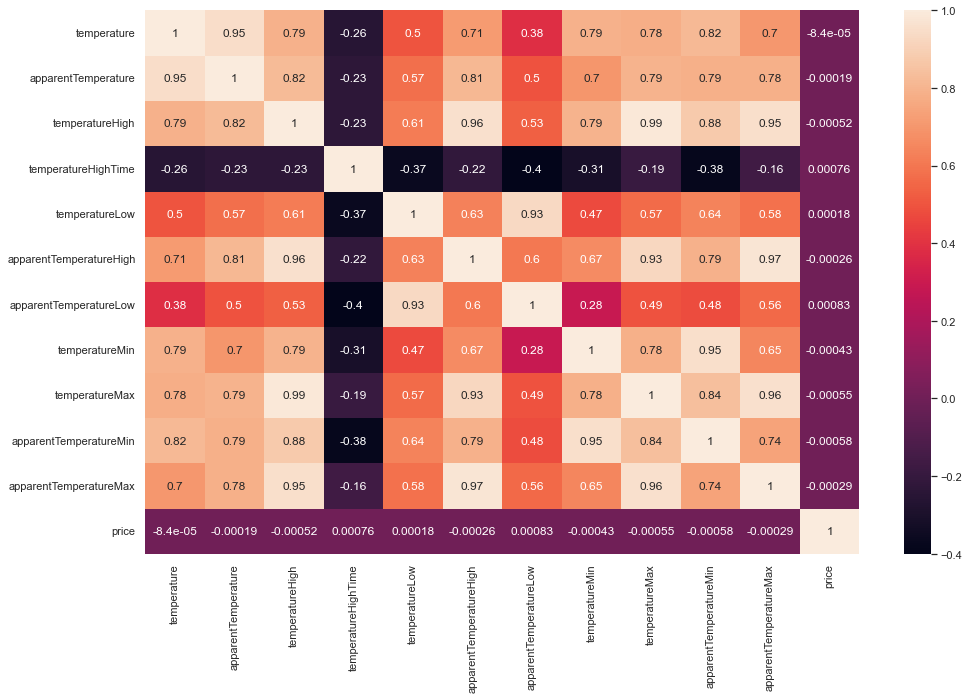

In [43]:
plt.figure(figsize=(16,10))
sns.heatmap(temp_df.corr(),annot=True)

In [44]:
new_df = new_df.drop(['temperature', 'apparentTemperature', 'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 
                'apparentTemperatureHigh', 'apparentTemperatureLow', 'temperatureMin', 'temperatureMax', 'apparentTemperatureMin', 
                'apparentTemperatureMax'], axis=1)

Ket :
- setelah dicek korelasinya menggunakan heatmap, tidak terdapat korelasi atau korelasi antara kolom _temperature_ dengan kolom _price_ sangat lemah maka tidak apa untuk didrop

In [45]:
#buat dataset khusus humidity untuk memudahkan mengecek korelasi dengan price
humid_df = new_df[['precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust', 'visibility', 'dewPoint', 'pressure', 
                'windBearing', 'cloudCover', 'uvIndex', 'ozone', 'moonPhase', 'precipIntensityMax', 'price']]

<AxesSubplot:>

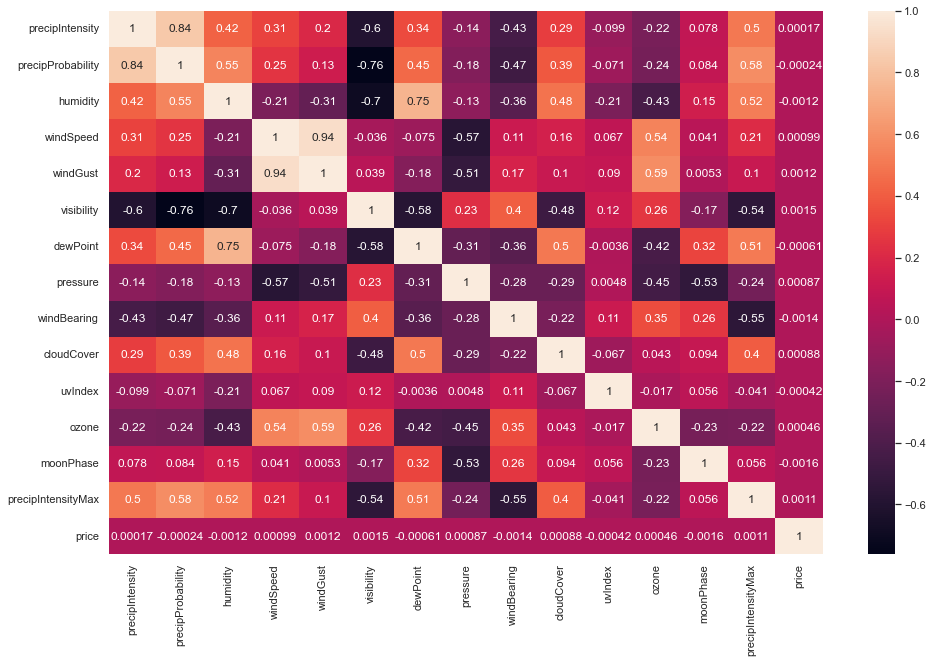

In [46]:
plt.figure(figsize=(16,10))
sns.heatmap(humid_df.corr(),annot=True)

In [47]:
new_df = new_df.drop(['precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust', 'visibility', 'dewPoint', 'pressure', 
                'windBearing', 'cloudCover', 'uvIndex', 'ozone', 'moonPhase', 'precipIntensityMax'], axis=1)

Ket :
- hasil yang didapatkan bahwa, kolom humdity dan lainya tidak memiliki korelasi atau korelasi antara _humidity_ dengan _price_ sangat rendah, maka harus didrop

In [48]:
cat_columns = new_df.select_dtypes(include=['object']).columns.tolist()

cat_columns

['timezone',
 'source',
 'destination',
 'cab_type',
 'product_id',
 'name',
 'short_summary',
 'icon']

- pisahkan kolom dengan data categorical untuk dikorelasikan nantinya

In [49]:
for val in new_df[cat_columns]:
    print(f'{val} : {new_df[val].unique()}')
    print()

timezone : ['America/New_York']

source : ['Haymarket Square' 'Back Bay' 'North End' 'North Station' 'Beacon Hill'
 'Boston University' 'Fenway' 'South Station' 'Theatre District'
 'West End' 'Financial District' 'Northeastern University']

destination : ['North Station' 'Northeastern University' 'West End' 'Haymarket Square'
 'South Station' 'Fenway' 'Theatre District' 'Beacon Hill' 'Back Bay'
 'North End' 'Financial District' 'Boston University']

cab_type : ['Lyft' 'Uber']

product_id : ['lyft_line' 'lyft_premier' 'lyft' 'lyft_luxsuv' 'lyft_plus' 'lyft_lux'
 '6f72dfc5-27f1-42e8-84db-ccc7a75f6969'
 '6c84fd89-3f11-4782-9b50-97c468b19529'
 '55c66225-fbe7-4fd5-9072-eab1ece5e23e'
 '9a0e7b09-b92b-4c41-9779-2ad22b4d779d'
 '6d318bcc-22a3-4af6-bddd-b409bfce1546'
 '997acbb5-e102-41e1-b155-9df7de0a73f2']

name : ['Shared' 'Lux' 'Lyft' 'Lux Black XL' 'Lyft XL' 'Lux Black' 'UberXL'
 'Black' 'UberX' 'WAV' 'Black SUV' 'UberPool']

short_summary : [' Mostly Cloudy ' ' Rain ' ' Clear ' ' Partly Clou

In [50]:
new_df = new_df.drop(['timezone','product_id'],axis=1)

Ket :
- timezone : didrop karena hanya memiliki 1 value
- product_id : didrop karena memiliki value yang random

In [51]:
new_df.head()

,hour,day,month,source,destination,cab_type,name,price,distance,surge_multiplier,latitude,longitude,short_summary,icon
0,9,16,12,Haymarket Square,North Station,Lyft,Shared,5.0,0.44,1.0,42.2148,-71.033,Mostly Cloudy,partly-cloudy-night
1,2,27,11,Haymarket Square,North Station,Lyft,Lux,11.0,0.44,1.0,42.2148,-71.033,Rain,rain
2,1,28,11,Haymarket Square,North Station,Lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,Clear,clear-night
3,4,30,11,Haymarket Square,North Station,Lyft,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,Clear,clear-night
4,3,29,11,Haymarket Square,North Station,Lyft,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,Partly Cloudy,partly-cloudy-night


In [52]:
#buat dataset khusus categorical setelah beberapa didrop
cat_df = new_df[['source', 'destination', 'cab_type', 'name', 'short_summary', 'icon', 'price']]

In [53]:
cat_df.shape

(637976, 7)

In [54]:
#untuk mengkorelasikan dengan kolom target, kolom type categorical harus diencode dlu
label = LabelEncoder()
for col in cat_df.select_dtypes(include='O').columns:
    cat_df[col]=label.fit_transform(cat_df[col])



In [55]:
cat_df.head()

,source,destination,cab_type,name,short_summary,icon,price
0,5,7,0,7,4,5,5.0
1,5,7,0,2,8,6,11.0
2,5,7,0,5,0,1,7.0
3,5,7,0,4,0,1,26.0
4,5,7,0,6,6,5,9.0


<AxesSubplot:>

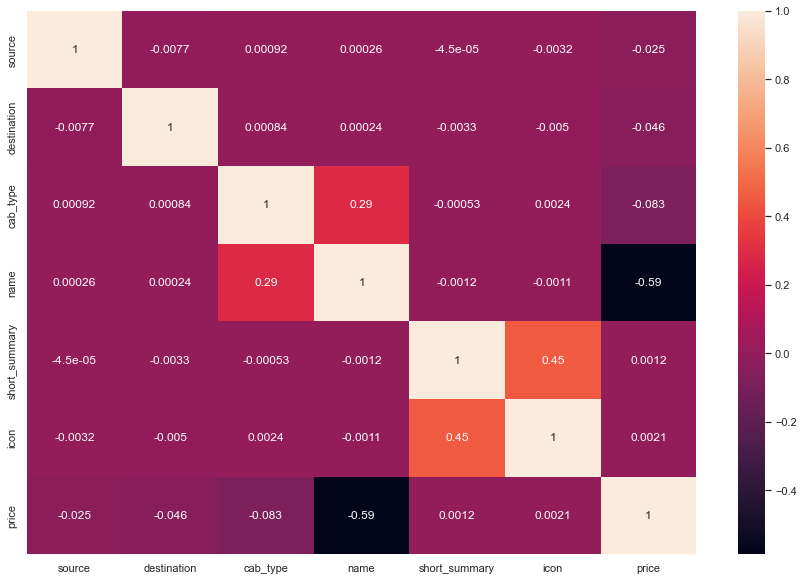

In [56]:
plt.figure(figsize=(15,10))
sns.heatmap(cat_df.corr(),annot=True)

In [57]:
new_df = new_df.drop(['source','destination','short_summary','icon', 'cab_type'],axis=1)

Ket :
- hasil yang didapatkan bahwa hanya kolom _name_ yang memiliki korelasi yang lebih baik dibandingkan dengan kolom lainya
- kolom yang memiliki korelasi rendah dapat didrop sebelum masuk ke proses modeling

In [58]:
new_df.head()

,hour,day,month,name,price,distance,surge_multiplier,latitude,longitude
0,9,16,12,Shared,5.0,0.44,1.0,42.2148,-71.033
1,2,27,11,Lux,11.0,0.44,1.0,42.2148,-71.033
2,1,28,11,Lyft,7.0,0.44,1.0,42.2148,-71.033
3,4,30,11,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033
4,3,29,11,Lyft XL,9.0,0.44,1.0,42.2148,-71.033


- dataset sesudah kolom categorical yang memiliki korelasi lemah didrop

In [59]:
other_df = ['hour', 'day', 'month', 'latitude', 'longitude', 'price' ]

- terakhir adalah kolom yang lainya, yang dibuat grafik korelasi dan ditentukan apakah didrop atau tidak

<AxesSubplot:>

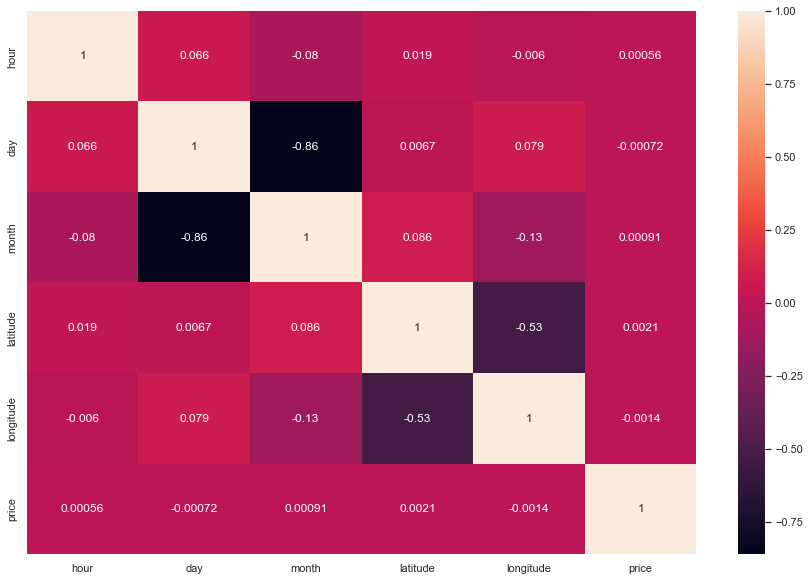

In [60]:
plt.figure(figsize=(15,10))
sns.heatmap(new_df[other_df].corr(),annot=True)

In [61]:
new_df = new_df.drop(['hour', 'day', 'month', 'latitude', 'longitude'], axis=1)

Ket :
- karena tidak ada korelasi yang kuat antara kolom di atas dengan kolom target _price_, maka dapat didrop

In [62]:
new_df.head()

,name,price,distance,surge_multiplier
0,Shared,5.0,0.44,1.0
1,Lux,11.0,0.44,1.0
2,Lyft,7.0,0.44,1.0
3,Lux Black XL,26.0,0.44,1.0
4,Lyft XL,9.0,0.44,1.0


- kolom final yang digunakan pada proses preprocessing

#### Handling Outlier

In [63]:
new_df.shape

(637976, 4)

Text(0.5, 1.0, 'Histogram')

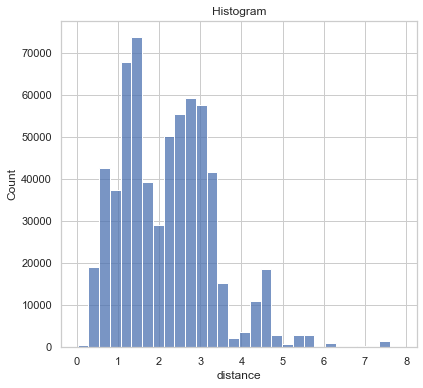

In [64]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.histplot(new_df['distance'], bins=30)
plt.title('Histogram')

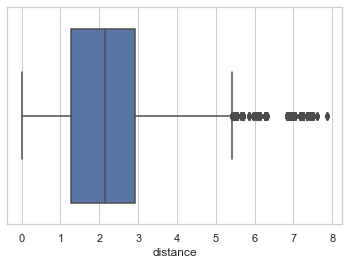

In [65]:
ax = sns.boxplot(x=new_df["distance"])

In [66]:
#tetepkan nilai iqr
q1 = np.quantile(new_df['distance'], 0.25)
q3 = np.quantile(new_df['distance'], 0.75)
iqr = q3 - q1

#cari batas atas dan batas bawah
upper = q3 + 1.5 * iqr
lower = q1 - 1.5 * iqr

In [67]:
#tampilkan outlier
outlier = new_df[(new_df['distance'] >= upper) | (new_df['distance'] <= lower)]
outlier.shape

(6942, 4)

In [68]:
upper

5.42

In [69]:
#capping df menggunakan filter batas atas dan batas bawah
new_df = new_df[(new_df['distance'] <= upper) & (new_df['distance'] >= lower)]

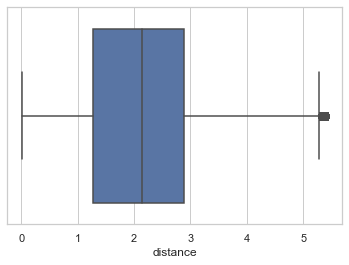

In [70]:
ax = sns.boxplot(x=new_df["distance"])

In [71]:
new_df.shape

(631304, 4)

Ket :

- histogram menunjukan distribusi skew ke kanan, sehingga remove outlier menggunakan metode IQR
- Outlier yang ada pada kolom distance berjumlah 6942, dan hanya pada batas atas
- batas atas iqr yaitu 5.42
- total row pada dataset setelah dicapping berjumlah 631304
- masih terdapat outlier menurut visualisasi boxplot, namun karena nilainya berdekatan dengan batas atas, maka tidak didrop

Karena outlier berjumlah hanya kurang lebih 1% dari dataset, maka outlier dapat didrop 

#### Spliting Data

In [72]:
#buat variabel X dan y, sebagai data yang akan displit
X = new_df.drop('price', axis=1)
y = new_df['price']

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=17) # 0.2 = 20% datatest, 80% datatrain

print('Number of train Size :' , X_train.shape)
print('Number of test Size :' , X_test.shape)

Number of train Size : (505043, 3)
Number of test Size : (126261, 3)


#### Handling Missing Value

In [74]:
X_train.isnull().sum()

name                0
distance            0
surge_multiplier    0
dtype: int64

In [75]:
X_test.isnull().sum()

name                0
distance            0
surge_multiplier    0
dtype: int64

In [76]:
y_train.isnull().sum()

0

In [77]:
y_test.isnull().sum()

0

Kesimpulanya, bahwa tidak terdapat missing value pada dataset yang sudah displit

#### Spliting Numerical and Categorical

In [78]:
num_columns = X_train.select_dtypes(include=np.number).columns.tolist()
cat_columns = X_train.select_dtypes(include=['object']).columns.tolist()

print('Numerical Columns :', num_columns)
print('Categorical Columns :', cat_columns)

Numerical Columns : ['distance', 'surge_multiplier']
Categorical Columns : ['name']


In [79]:
X_train_num = X_train[num_columns]
X_train_cat = X_train[cat_columns]

X_test_num = X_test[num_columns]
X_test_cat = X_test[cat_columns]

#### Feature Scalling

In [80]:
scaler = StandardScaler()
scaler.fit(X_train_num) 

X_train_num_scaled = scaler.transform(X_train_num)
X_test_num_scaled = scaler.transform(X_test_num)

- supaya data training tidak memiliki nilai yang jauh, maka data train akan discaling menggunakan _StandardScaler_

#### Feature Encoding

In [81]:
encoder = OneHotEncoder(sparse=False)
encoder.fit(X_train_cat)
X_train_cat_enc = encoder.transform(X_train_cat)
X_test_cat_enc = encoder.transform(X_test_cat)
cat_col_name = encoder.get_feature_names(['name'])


- encoding bertujuan untuk memberikan nilai ke label dengan type numerikal

In [82]:
X_train_final = np.concatenate([X_train_num_scaled, X_train_cat_enc], axis=1)
X_test_final =  np.concatenate([X_test_num_scaled, X_test_cat_enc], axis=1)

X_train_final

array([[-0.93196071, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  1.        ],
       [-0.69557498, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 2.16942014, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-1.04542586, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  1.        ],
       [ 0.47689827, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.43907656, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  1.        ]])

- setelah data train dan data test discaling dan diencoding, concat kedua data menjadi satu data final yang akan dibuat modelnya

In [83]:
df_cat = pd.DataFrame(X_train_cat_enc, columns=cat_col_name)
df_num = pd.DataFrame(X_train_num_scaled, columns=num_columns)
df_num.join(df_cat).head()

,distance,surge_multiplier,name_Black,name_Black SUV,name_Lux,name_Lux Black,name_Lux Black XL,name_Lyft,name_Lyft XL,name_Shared,name_UberPool,name_UberX,name_UberXL,name_WAV
0,-0.931961,-0.158619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.695575,-0.158619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2.169420,-0.158619,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.629387,-0.158619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.874026,-0.158619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


- data final di atas, adalah data yang sudah siap untuk diproses model linear regression

---
### Model Definition

In [84]:
reg = LinearRegression()

- model definition yaitu membuat sebuah variabel untuk mendefinisikan fungsi linear regression

---
### Model Training

In [85]:
X_train_final

array([[-0.93196071, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  1.        ],
       [-0.69557498, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 2.16942014, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-1.04542586, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  1.        ],
       [ 0.47689827, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.43907656, -0.15861876,  0.        , ...,  0.        ,
         0.        ,  1.        ]])

In [86]:
y_train

619418     7.00
136156     7.50
325419    42.50
136918     9.50
591470    11.50
30962     10.50
125424    19.50
313547    10.50
644690    42.50
623544     9.50
285309    39.50
170060    16.50
358407    16.50
251571    20.50
64511     31.50
652711     7.00
463946    18.00
424678    11.00
442993     7.00
149656     7.00
197731    10.50
438641    13.00
407394    19.50
403554     9.00
339462    22.50
128665     5.00
212137     7.00
384855    31.50
552498    11.00
574070    17.50
526754    26.00
465370    10.50
47451     16.50
341381     6.50
574492    10.50
106222    19.50
566448     7.00
554219     8.50
410354     9.50
95526     15.00
157972     9.00
595039    16.50
47029     29.50
338137     8.00
34061      9.00
666315    16.50
443674    19.50
472549    11.00
124475    19.00
382390    22.50
295085    13.50
96835     13.00
686865    32.50
559888    30.00
270590    16.50
60845     10.00
108514    13.50
386663    11.50
336755    19.50
239093    13.50
535946     8.00
166899     3.50
367384  

In [87]:
model = reg.fit(X_train_final, y_train)

- model yang sudah didefinisikan ditraining antara X train nya dengan y train

---
### Model Evaluation

1.  MSE dan RMSE

In [88]:
y_pred_train = model.predict(X_train_final)
y_pred_test = model.predict(X_test_final)

In [89]:
print('Error-Train : ', mean_squared_error(y_train, y_pred_train))
print('Error-Test : ', mean_squared_error(y_test, y_pred_test))

Error-Train :  5.986067261581349
Error-Test :  6.015014337318625


In [90]:
print('RMSE : ', np.sqrt(mean_squared_error(y_train, y_pred_train)))

RMSE :  2.446644081508659


2.  R2 Score

In [91]:
print('R2 Score : ', r2_score(y_test, y_pred_test))

R2 Score :  0.9293830172721347


Ket :
- R2 Square adalah ukuran yang baik untuk menentukan seberapa baik model cocok dengan variabel dependen, dalam hal ini target _price_ dipengaruhi oleh 3 variabel dependen (_name_, _distance_, 
_surge_multiplier_), dan nilai yang dihasilkan yaitu 93% yang dimana, model yang kita hasilnya baik
- Root Mean Square Error (RMSE) merupakan besarnya tingkat kesalahan hasil prediksi, dimana semakin kecil (mendekati 0) nilai RMSE maka hasil prediksi akan semakin akurat, dalam model kali ini rmsenya adalah 2.44, cukup baik untuk error pada model

---
### Model Inference

- model inference digunakan untuk melihat bagaiamana sebuah model dicari linear regressionya tanpa ditraining lebih dahulu, atau menggunakan data yang beda/baru dari main modelnya

In [92]:
#data inference displi kolom numerikal dan categorikalnya
data_inf_num = data_inf[num_columns]
data_inf_cat = data_inf[cat_columns]

In [93]:
#data yang sudah displi, discaling dan diencoding
data_inf_num_scaled = scaler.transform(data_inf_num)
data_inf_cat_enc = encoder.transform(data_inf_cat)

In [94]:
#concat kedua data di atas, dan menghasilkan data final
data_inf_final = np.concatenate([data_inf_num_scaled, data_inf_cat_enc], axis=1)

In [95]:
linreg = LinearRegression()

In [96]:
#prediksi data inference
y_pred_inf = model.predict(data_inf_final)

In [97]:
#hasil prediksi dari model menggunakan data inference
y_pred_inf

array([48.00162888, 28.60878944,  7.32508278,  7.11236095,  6.38413811,
        6.68405056, 10.75156784, 28.83722115,  9.78206825,  6.04393387])

In [98]:
#cari intercept dan juga slopenya
intercept = model.intercept_
slope = model.coef_

print('Intercept : ', intercept)
print('Slope : ', slope)

Intercept :  6005054622.161646
Slope :  [ 3.01985637e+00  1.76286537e+00 -6.00505460e+09 -6.00505459e+09
 -6.00505460e+09 -6.00505460e+09 -6.00505459e+09 -6.00505461e+09
 -6.00505461e+09 -6.00505462e+09 -6.00505461e+09 -6.00505461e+09
 -6.00505461e+09 -6.00505461e+09]


Ket :

- untuk mencari data target _price_ dapat membandingkan dengan prediksi yang dihasilkan oleh model inference,<br> model inference menunjukan bagaimana model dibuat menggunakan data yang belum "tersentuh"

---
### Kesimpulan

- Terlalu banyak feature yang tidak memiliki korelasi dengan target, dari 57 feature hanya dipake 3
- Tidak ada missing value pada feature
- Terdapat outlier pada feature kolom _distance_
- Pengukuran akurasi yang digunakan menggunakan R2 score dan juga rmse
- Scalling menggunakan _StandardScaler_ pada feature dengan type numerikal
- Encoding menggunakan _OneHotEncoder_ pada feature dengan type categorical, karena data tersebut tidak memiliki nilai yang bertingkat
- Nilai akurasi dari model yang dibuat cukup baik yaitu mencapai 93% akurasinya
- Nilai error pada model yaitu 2.44
- Intercept pada model inference 6005054622.16
- Slope pada model inference <br>
    [3.01985637e+00  1.76286537e+00 -6.00505460e+09 -6.00505459e+09 <br>
    -6.00505460e+09 -6.00505460e+09 -6.00505459e+09 -6.00505461e+09 <br>
    -6.00505461e+09 -6.00505462e+09 -6.00505461e+09 -6.00505461e+09 <br>
    -6.00505461e+09 -6.00505461e+09]